# Causal Inference Analysis Part1

## Importation of Library

In [41]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## Imporation of the dataset

In [14]:
data1 = pd.read_csv("../data/data.csv")
print('The numbers of line is ', data1.shape[0], "and the numbers of columns is ",data1.shape[1],".")

The numbers of line is  569 and the numbers of columns is  33 .


### Let's take a look of our dataset

In [15]:
data1.head(6)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN
5,843786,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.1578,0.08089,...,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.12440,NaN


## Data preprocessing

In [26]:
data1.dtypes

id                           int64
diagnosis                   object
radius_mean                float64
texture_mean               float64
perimeter_mean             float64
area_mean                  float64
smoothness_mean            float64
compactness_mean           float64
concavity_mean             float64
concave points_mean        float64
symmetry_mean              float64
fractal_dimension_mean     float64
radius_se                  float64
texture_se                 float64
perimeter_se               float64
area_se                    float64
smoothness_se              float64
compactness_se             float64
concavity_se               float64
concave points_se          float64
symmetry_se                float64
fractal_dimension_se       float64
radius_worst               float64
texture_worst              float64
perimeter_worst            float64
area_worst                 float64
smoothness_worst           float64
compactness_worst          float64
concavity_worst     

In [16]:
# how many missing values exist or better still what is the % of missing values in the dataset?
def percent_missing(df):

    # Calculate total number of cells in dataframe
    totalCells = np.product(df.shape)

    # Count number of missing values per column
    missingCount = df.isnull().sum()

    # Calculate total number of missing values
    totalMissing = missingCount.sum()

    # Calculate percentage of missing values
    print("The Data Breast Cancer contains", round(((totalMissing/totalCells) * 100), 2), "%", "missing values.")

percent_missing(data1)

The Data Breast Cancer contains 3.03 % missing values.


In [17]:
# Now which column(s) has missing values
data1.isna().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

In [18]:
# Function to calculate missing values by column
def missing_values_table(df):
    # Total missing values
    mis_val = df.isnull().sum()

    # Percentage of missing values
    mis_val_percent = 100 * df.isnull().sum() / len(df)

    # dtype of missing values
    mis_val_dtype = df.dtypes

    # Make a table with the results
    mis_val_table = pd.concat([mis_val, mis_val_percent, mis_val_dtype], axis=1)

    # Rename the columns
    mis_val_table_ren_columns = mis_val_table.rename(
    columns = {0 : 'Missing Values', 1 : '% of Total Values', 2: 'Dtype'})

    # Sort the table by percentage of missing descending
    mis_val_table_ren_columns = mis_val_table_ren_columns[
        mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
    '% of Total Values', ascending=False).round(1)

    # Print some summary information
    print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
        "There are " + str(mis_val_table_ren_columns.shape[0]) +
          " columns that have missing values.")

    # Return the dataframe with missing information
    return mis_val_table_ren_columns


In [19]:
missing_values_table(data1)

Your selected dataframe has 33 columns.
There are 1 columns that have missing values.


,Missing Values,% of Total Values,Dtype
Unnamed: 32,569,100.0,float64


### Let's remove the variable which contains  a lot of missing value

In [24]:
# drop columns with more than 30% missing values
df_clean = data1.drop(['Unnamed: 32'], axis=1)
print("The data clean contains now :",df_clean.shape[1],'columns')

The data clean contains now : 32 columns


### Unique value verification

In [20]:
def unique_values(df):
    unique_values=pd.DataFrame(df.apply(lambda x: len(x.value_counts(dropna=False)), axis=0), 
                           columns=['Unique Value Count']).sort_values(by='Unique Value Count', ascending=True)
    return unique_values

In [23]:
unique_values(df_clean)

,Unique Value Count
diagnosis,2
smoothness_worst,411
symmetry_mean,432
radius_mean,456
radius_worst,457
smoothness_mean,474
texture_mean,479
concave points_worst,492
symmetry_se,498
fractal_dimension_mean,499


With the result above , we can notice that the ID column  contains 569 unique ID number which is equal to the number of ligne. Then, we not need to regroup by ID.

## Data exploration

In [31]:
df_clean.dtypes

id                           int64
diagnosis                   object
radius_mean                float64
texture_mean               float64
perimeter_mean             float64
area_mean                  float64
smoothness_mean            float64
compactness_mean           float64
concavity_mean             float64
concave points_mean        float64
symmetry_mean              float64
fractal_dimension_mean     float64
radius_se                  float64
texture_se                 float64
perimeter_se               float64
area_se                    float64
smoothness_se              float64
compactness_se             float64
concavity_se               float64
concave points_se          float64
symmetry_se                float64
fractal_dimension_se       float64
radius_worst               float64
texture_worst              float64
perimeter_worst            float64
area_worst                 float64
smoothness_worst           float64
compactness_worst          float64
concavity_worst     

## Univariate analysis

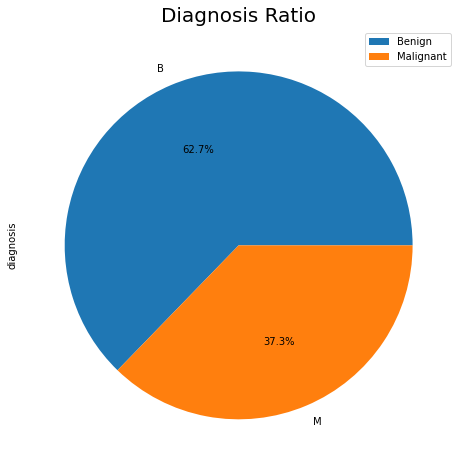

In [28]:
plt.figure(figsize=(16,8))
df_clean.diagnosis.value_counts().plot.pie(autopct="%.1f%%")
plt.title("Diagnosis Ratio", fontsize = 20)
plt.legend(['Benign','Malignant'])

In [34]:
list=['id','diagnosis']
data2=df_clean.drop(list,axis=1)
data2.head(3)

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.8,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.9,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.8,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.0,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.5,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758


In [37]:
data2.columns

Index(['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean',
       'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [50]:
data2.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


## Split the data by diagnostic
#### benign

In [97]:
data_b=df_clean[df_clean['diagnosis']=='B']
data_b.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,3.570000e+02,357.000000,357.000000,357.000000,357.000000,357.000000,357.000000,357.000000,357.000000,357.000000,...,357.000000,357.000000,357.000000,357.000000,357.000000,357.000000,357.000000,357.000000,357.000000,357.000000
mean,2.654382e+07,12.146524,17.914762,78.075406,462.790196,0.092478,0.080085,0.046058,0.025717,0.174186,...,13.379801,23.515070,87.005938,558.899440,0.124959,0.182673,0.166238,0.074444,0.270246,0.079442
std,1.167397e+08,1.780512,3.995125,11.807438,134.287118,0.013446,0.033750,0.043442,0.015909,0.024807,...,1.981368,5.493955,13.527091,163.601424,0.020013,0.092180,0.140368,0.035797,0.041745,0.013804
min,8.913000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156600,0.055210
25%,8.746620e+05,11.080000,15.150000,70.870000,378.200000,0.083060,0.055620,0.020310,0.015020,0.158000,...,12.080000,19.580000,78.270000,447.100000,0.110400,0.112000,0.077080,0.051040,0.240600,0.070090
50%,9.089160e+05,12.200000,17.390000,78.180000,458.400000,0.090760,0.075290,0.037090,0.023440,0.171400,...,13.350000,22.820000,86.920000,547.400000,0.125400,0.169800,0.141200,0.074310,0.268700,0.077120
75%,8.812816e+06,13.370000,19.760000,86.100000,551.100000,0.100700,0.097550,0.059990,0.032510,0.189000,...,14.800000,26.510000,96.590000,670.000000,0.137600,0.230200,0.221600,0.097490,0.298300,0.085410
max,9.113205e+08,17.850000,33.810000,114.600000,992.100000,0.163400,0.223900,0.410800,0.085340,0.274300,...,19.820000,41.780000,127.100000,1210.000000,0.200600,0.584900,1.252000,0.175000,0.422800,0.148600


### malignant

In [101]:
data_m=df_clean[df_clean['diagnosis']=='M']
data_m.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,2.120000e+02,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,...,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000,212.000000
mean,3.681805e+07,17.462830,21.604906,115.365377,978.376415,0.102898,0.145188,0.160775,0.087990,0.192909,...,21.134811,29.318208,141.370330,1422.286321,0.144845,0.374824,0.450606,0.182237,0.323468,0.091530
std,1.378965e+08,3.203971,3.779470,21.854653,367.937978,0.012608,0.053987,0.075019,0.034374,0.027638,...,4.283569,5.434804,29.457055,597.967743,0.021870,0.170372,0.181507,0.046308,0.074685,0.021553
min,8.670000e+03,10.950000,10.380000,71.900000,361.600000,0.073710,0.046050,0.023980,0.020310,0.130800,...,12.840000,16.670000,85.100000,508.100000,0.088220,0.051310,0.023980,0.028990,0.156500,0.055040
25%,8.613450e+05,15.075000,19.327500,98.745000,705.300000,0.094010,0.109600,0.109525,0.064620,0.174050,...,17.730000,25.782500,119.325000,970.300000,0.130475,0.244475,0.326425,0.152750,0.276500,0.076302
50%,8.953665e+05,17.325000,21.460000,114.200000,932.000000,0.102200,0.132350,0.151350,0.086280,0.189900,...,20.590000,28.945000,138.000000,1303.000000,0.143450,0.356350,0.404900,0.182000,0.310300,0.087600
75%,8.911290e+06,19.590000,23.765000,129.925000,1203.750000,0.110925,0.172400,0.203050,0.103175,0.209850,...,23.807500,32.690000,159.800000,1712.750000,0.155975,0.447850,0.556175,0.210675,0.359225,0.102625
max,9.112962e+08,28.110000,39.280000,188.500000,2501.000000,0.144700,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.170000,0.291000,0.663800,0.207500


### Normalization

In [53]:

data_nor= (data2-data2.mean())/(data2.std())
data_nor.head(2)


,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1.096100,-2.071512,1.268817,0.98351,1.567087,3.280628,2.650542,2.530249,2.215566,2.253764,...,1.885031,-1.358098,2.301575,1.999478,1.306537,2.614365,2.107672,2.294058,2.748204,1.935312
1,1.828212,-0.353322,1.684473,1.90703,-0.826235,-0.486643,-0.023825,0.547662,0.001391,-0.867889,...,1.804340,-0.368879,1.533776,1.888827,-0.375282,-0.430066,-0.146620,1.086129,-0.243675,0.280943


### Make a set of data for mean

In [73]:
y=data1['diagnosis']
data3_m=pd.concat([y,data_nor.iloc[:,0:10]],axis=1)
data4_m=pd.melt(data3_m,id_vars="diagnosis",var_name="features",value_name='value')
data4_m

,diagnosis,features,value
0,M,radius_mean,1.096100
1,M,radius_mean,1.828212
2,M,radius_mean,1.578499
3,M,radius_mean,-0.768233
4,M,radius_mean,1.748758
...,...,...,...
5685,M,fractal_dimension_mean,-0.930209
5686,M,fractal_dimension_mean,-1.057681
5687,M,fractal_dimension_mean,-0.894800
5688,M,fractal_dimension_mean,1.042778


In [63]:
data3_m.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean'],
      dtype='object')

## Let's plot somes distributions plot 
## for image mean 

Text(0.5, 1.0, 'compactness_mean')

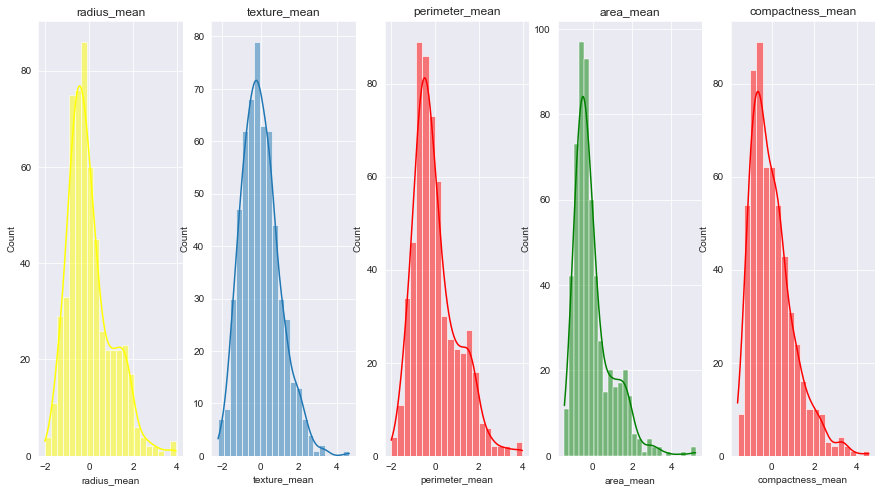

In [72]:
fig, ax = plt.subplots(1,5, figsize=(15, 8))
sns.set_style('darkgrid')
sns.histplot(data3_m['radius_mean'],color='yellow',kde=True,ax=ax[0])
ax[0].set_title("radius_mean")
sns.histplot(data3_m['texture_mean'],ax=ax[1],kde=True)
ax[1].set_title("texture_mean")
sns.histplot(data3_m['perimeter_mean'],color='red',kde=True,ax=ax[2])
ax[2].set_title("perimeter_mean")
sns.histplot(data3_m['area_mean'],ax=ax[3],kde=True,color='green')
ax[3].set_title("area_mean")
sns.histplot(data3_m['compactness_mean'],color='red',kde=True,ax=ax[4])
ax[4].set_title("compactness_mean")

## For Sd image

In [74]:

y=data1['diagnosis']
data3_sd=pd.concat([y,data_nor.iloc[:,11:20]],axis=1)
data4_sd=pd.melt(data3_sd,id_vars="diagnosis",var_name="features",value_name='value')
data4_sd

,diagnosis,features,value
0,M,texture_se,-0.564768
1,M,texture_se,-0.875473
2,M,texture_se,-0.779398
3,M,texture_se,-0.110312
4,M,texture_se,-0.789549
...,...,...,...
5116,M,fractal_dimension_se,0.167832
5117,M,fractal_dimension_se,-0.490124
5118,M,fractal_dimension_se,0.036694
5119,M,fractal_dimension_se,0.903262


In [75]:
data3_sd.columns

Index(['diagnosis', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se'],
      dtype='object')

Text(0.5, 1.0, 'compactness_se')

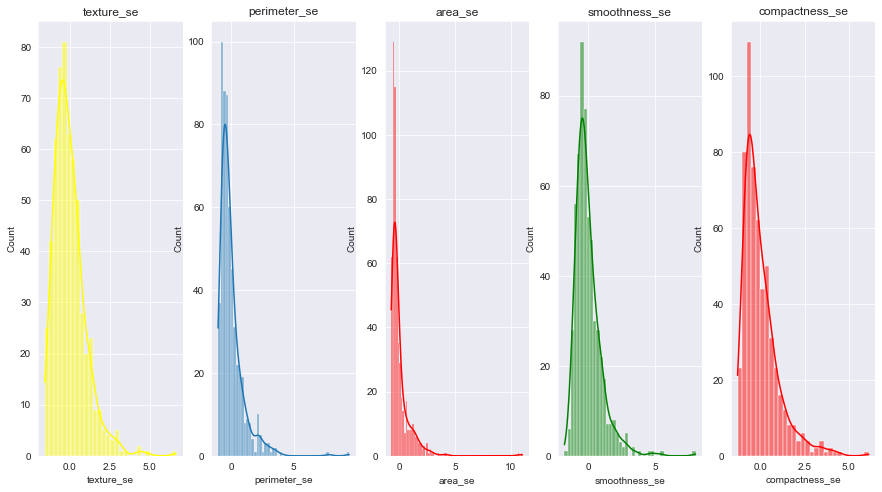

In [79]:
fig, ax = plt.subplots(1,5, figsize=(15, 8))
sns.set_style('darkgrid')
sns.histplot(data3_sd['texture_se'],color='yellow',kde=True,ax=ax[0])
ax[0].set_title("texture_se")
sns.histplot(data3_sd['perimeter_se'],ax=ax[1],kde=True)
ax[1].set_title("perimeter_se")
sns.histplot(data3_sd['area_se'],color='red',kde=True,ax=ax[2])
ax[2].set_title("area_se")
sns.histplot(data3_sd['smoothness_se'],ax=ax[3],kde=True,color='green')
ax[3].set_title("smoothness_se")
sns.histplot(data3_sd['compactness_se'],color='red',kde=True,ax=ax[4])
ax[4].set_title("compactness_se")

## For worst image

In [80]:
y=data1['diagnosis']
data3_worst=pd.concat([y,data_nor.iloc[:,21:30]],axis=1)
data4_worst=pd.melt(data3_worst,id_vars="diagnosis",var_name="features",value_name='value')
data4_worst

,diagnosis,features,value
0,M,texture_worst,-1.358098
1,M,texture_worst,-0.368879
2,M,texture_worst,-0.023953
3,M,texture_worst,0.133866
4,M,texture_worst,-1.465481
...,...,...,...
5116,M,fractal_dimension_worst,-0.708467
5117,M,fractal_dimension_worst,-0.973122
5118,M,fractal_dimension_worst,-0.318129
5119,M,fractal_dimension_worst,2.217684


In [81]:
data3_worst.columns

Index(['diagnosis', 'texture_worst', 'perimeter_worst', 'area_worst',
       'smoothness_worst', 'compactness_worst', 'concavity_worst',
       'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

Text(0.5, 1.0, 'compactness_se')

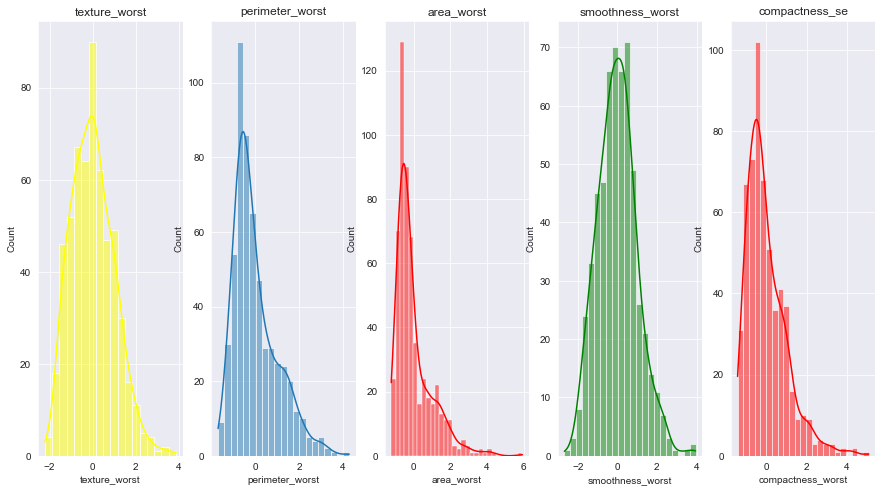

In [83]:
fig, ax = plt.subplots(1,5, figsize=(15, 8))
sns.set_style('darkgrid')
sns.histplot(data3_worst['texture_worst'],color='yellow',kde=True,ax=ax[0])
ax[0].set_title("texture_worst")
sns.histplot(data3_worst['perimeter_worst'],ax=ax[1],kde=True)
ax[1].set_title("perimeter_worst")
sns.histplot(data3_worst['area_worst'],color='red',kde=True,ax=ax[2])
ax[2].set_title("area_worst")
sns.histplot(data3_worst['smoothness_worst'],ax=ax[3],kde=True,color='green')
ax[3].set_title("smoothness_worst")
sns.histplot(data3_worst['compactness_worst'],color='red',kde=True,ax=ax[4])
ax[4].set_title("compactness_se")

## Bivariate analysis

### Histograms will show how frequently data of each type appears in the dataset i.e the frequency of malign and benign cancer.
I did it for area mean in the field of mean

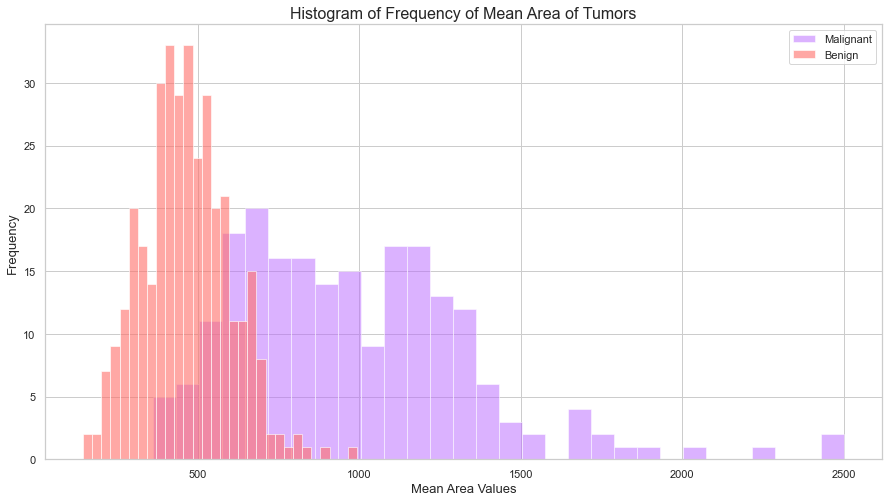

The Maximum Mean Area for Malignant Tumor is 20.0
The Maximum Mean Area for Benign Tumor is 33.0


In [89]:
plt.figure(figsize=(15, 8))
M = plt.hist(df_clean[df_clean.diagnosis == 'M'].area_mean, bins=30, label='Malignant', alpha=0.5, color='#b967ff')
B = plt.hist(df_clean[df_clean.diagnosis == 'B'].area_mean, bins=30, label='Benign', alpha=0.6, color='#ff6f69')
plt.legend()
plt.xlabel('Mean Area Values', fontsize=13)
plt.ylabel('Frequency', fontsize=13)
plt.title('Histogram of Frequency of Mean Area of Tumors', fontsize=16)
plt.show()

# Calculating the maximum mean area of malignant and benign tumors

print('The Maximum Mean Area for Malignant Tumor is',M[0].max())
print('The Maximum Mean Area for Benign Tumor is',B[0].max())

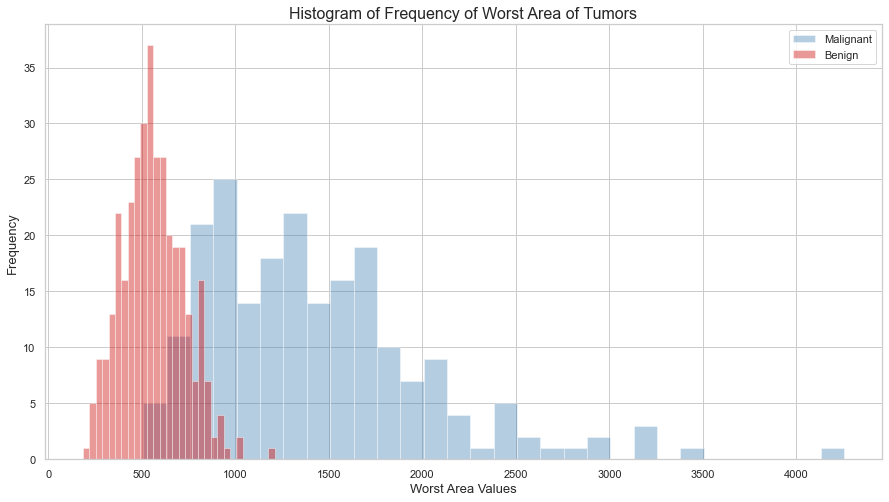

The Maximum Worst Area for Malignant Tumor is 25.0
The Maximum Worst Area for Benign Tumor is 37.0


In [91]:
plt.figure(figsize=(15, 8))
M = plt.hist(df_clean[df_clean.diagnosis == 'M'].area_worst, bins=30, label='Malignant', alpha=0.4, color='#4682b4')
B = plt.hist(df_clean[df_clean.diagnosis == 'B'].area_worst, bins=30, label='Benign', alpha=0.4, color='#cc0000')
plt.legend()
plt.xlabel('Worst Area Values', fontsize=13)
plt.ylabel('Frequency', fontsize=13)
plt.title('Histogram of Frequency of Worst Area of Tumors', fontsize=16)
plt.show()

# Calculating the maximum mean area of malignant and benign tumors

print('The Maximum Worst Area for Malignant Tumor is',M[0].max())
print('The Maximum Worst Area for Benign Tumor is',B[0].max())

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, 'radius_mean'),
  Text(1, 0, 'texture_mean'),
  Text(2, 0, 'perimeter_mean'),
  Text(3, 0, 'area_mean'),
  Text(4, 0, 'smoothness_mean'),
  Text(5, 0, 'compactness_mean'),
  Text(6, 0, 'concavity_mean'),
  Text(7, 0, 'concave points_mean'),
  Text(8, 0, 'symmetry_mean'),
  Text(9, 0, 'fractal_dimension_mean')])

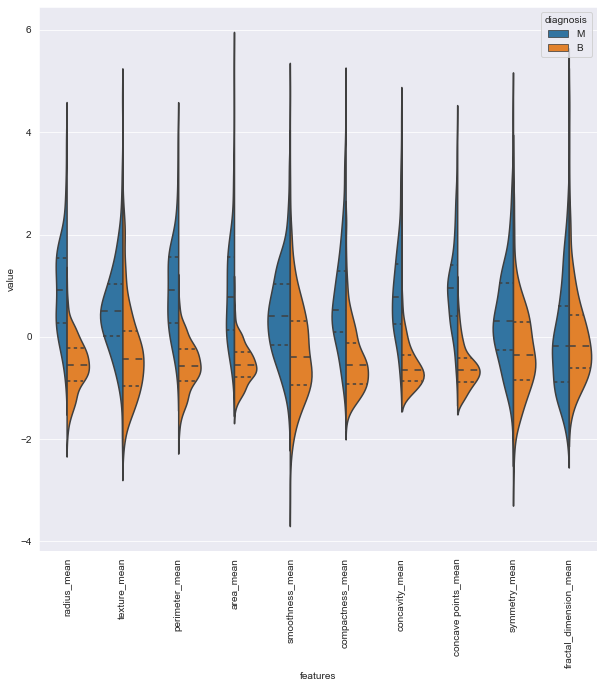

In [85]:
plt.figure(figsize=(10,10))
sns.violinplot(x="features", y="value", hue="diagnosis", data=data4_m, split=True, inner="quart")
plt.xticks(rotation=90)

The plot above showed the distibution  of each columns in the field of mean   for each diagnostic.

### Barplot : mean of Malignant and Benign Tumors

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, 'radius_mean'),
  Text(1, 0, 'texture_mean'),
  Text(2, 0, 'perimeter_mean'),
  Text(3, 0, 'area_mean'),
  Text(4, 0, 'smoothness_mean'),
  Text(5, 0, 'compactness_mean'),
  Text(6, 0, 'concavity_mean'),
  Text(7, 0, 'concave points_mean'),
  Text(8, 0, 'symmetry_mean'),
  Text(9, 0, 'fractal_dimension_mean')])

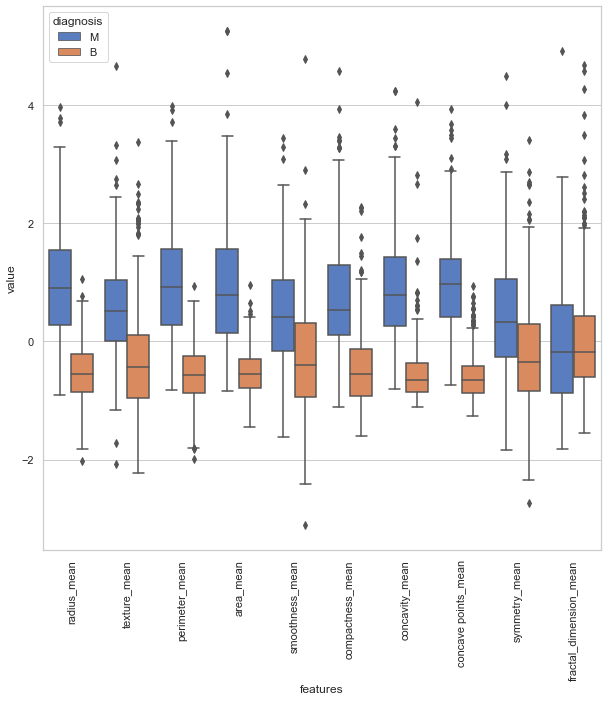

In [92]:
plt.figure(figsize=(10,10))
sns.boxplot(x="features",y="value", hue="diagnosis", data=data4_m)
plt.xticks(rotation=90)

C:\Users\hp\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 60.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\hp\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 70.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\hp\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 61.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\hp\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 58.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\hp\anaconda3\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 61.7% of the points cannot be plac

(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 [Text(0, 0, 'area_mean'),
  Text(1, 0, 'area_se'),
  Text(2, 0, 'area_worst'),
  Text(3, 0, 'compactness_mean'),
  Text(4, 0, 'compactness_se'),
  Text(5, 0, 'compactness_worst'),
  Text(6, 0, 'concave points_mean'),
  Text(7, 0, 'concave points_se'),
  Text(8, 0, 'concave points_worst'),
  Text(9, 0, 'concavity_mean')])

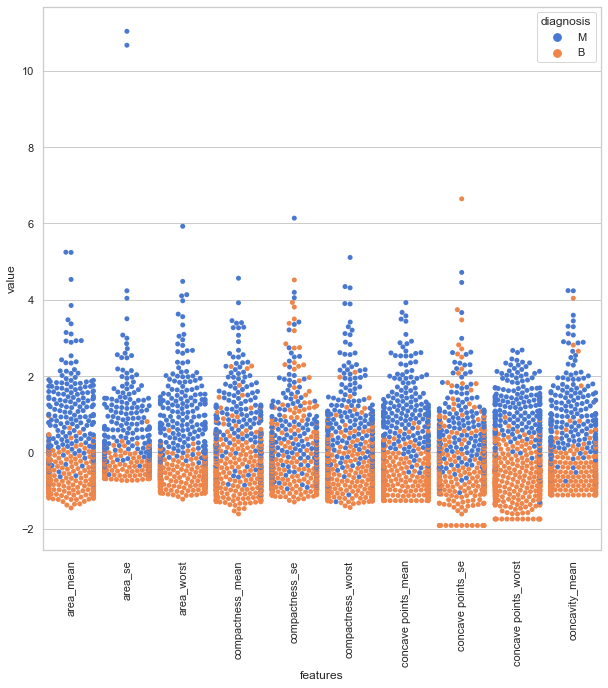

In [87]:
sns.set(style="whitegrid", palette="muted")
data_dia=y
data=df_clean
data_n_2= (data-data.mean())/(data.std())
data=pd.concat([y, data_n_2.iloc[:,0:10]], axis=1)
data=pd.melt(data, id_vars="diagnosis", var_name="features", value_name='value')
plt.figure(figsize=(10,10))
#tic=time.time()
sns.swarmplot(x="features", y="value", hue="diagnosis", data=data)
plt.xticks(rotation=90)

### Barplot : texture_mean and radius_mean of Malignant and Benign Tumors

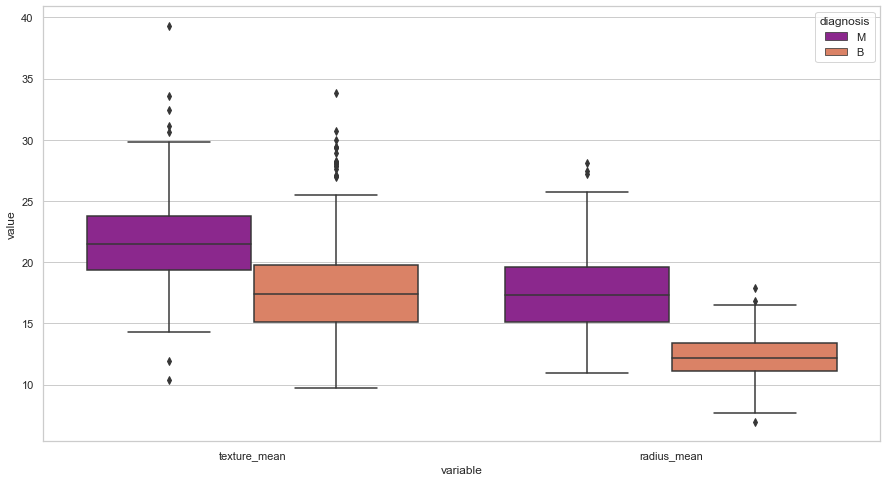

In [93]:
melted_data = pd.melt(df_clean, id_vars='diagnosis', value_vars=['texture_mean', 'radius_mean'])
plt.figure(figsize=(15, 8))
sns.boxplot(x='variable', y='value', hue='diagnosis', data=melted_data,palette='plasma')
plt.show()

This Plot shows the Outliers in texture_mean and radius_mean of Malignant and Benign Tumors. We can notice  a difference among them . These Outliers can be Rare events or Errors.

### Distribution graph per diagnostic

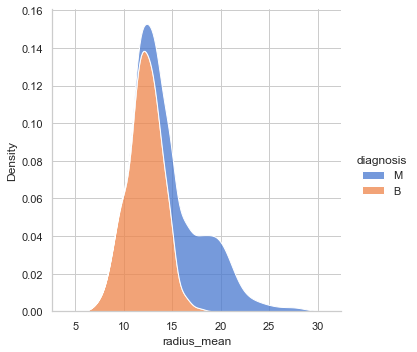

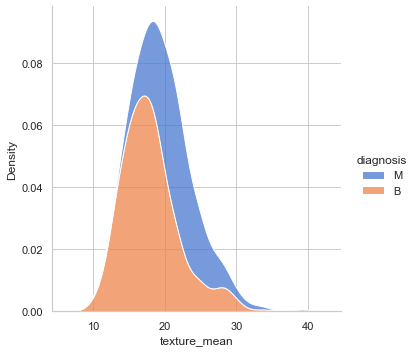

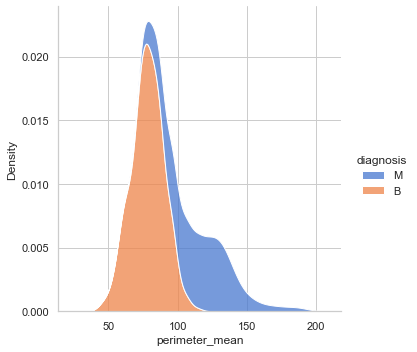

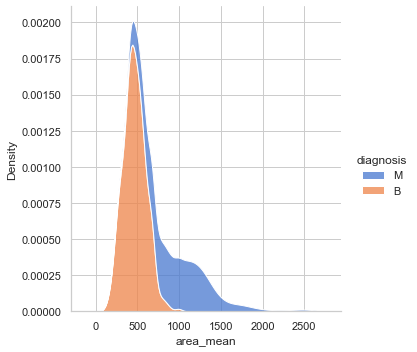

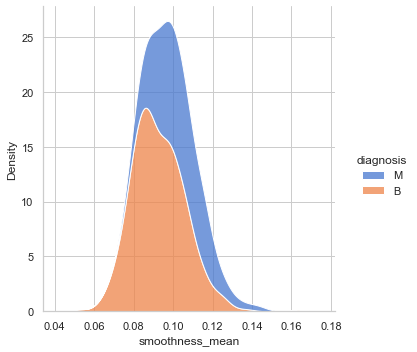

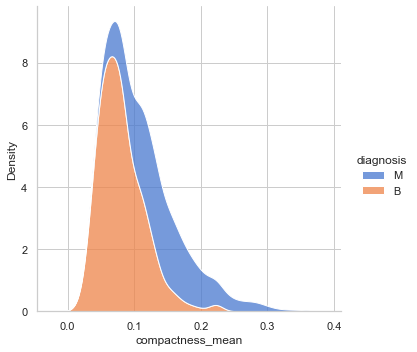

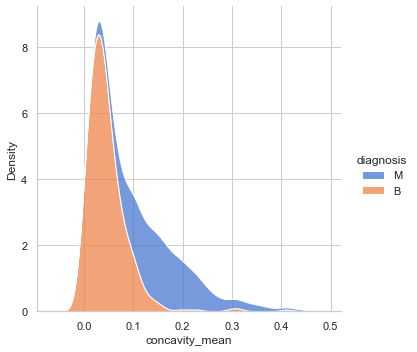

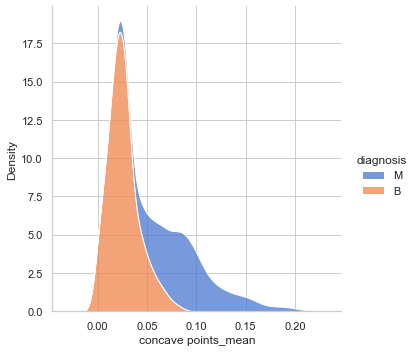

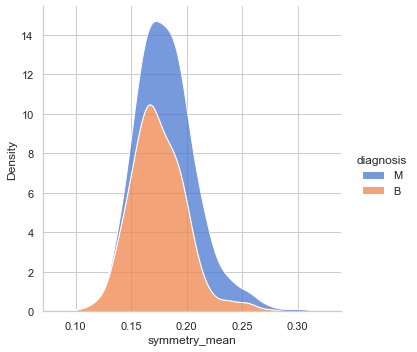

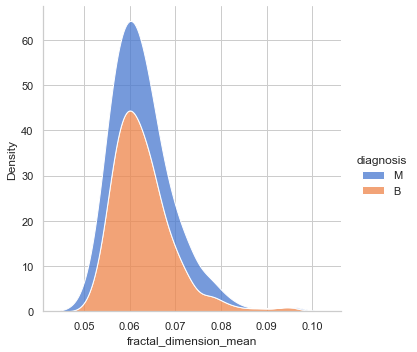

In [109]:
#Let us check the difference between the means values of attributes by diagnostic


mean_col = ['radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean']

for col in mean_col:
    sns.displot(df_clean, x=col, hue="diagnosis", kind="kde", multiple="stack")

From the  plots above, it that the radius mean,texture mean, perimeter mean, area mean, smoothness mean, compactness mean, concavity mean, concave points mean, symmetry mean and the fractal dimenion mean is significantly varying in the different types of tumors.

## Skweness and Kurtosis(Fisher's)
Skewness is a measure of the asymmetry of a distribution. This value can be positive or negative. \
-A negative skew indicates that the tail is on the left side of the distribution, which extends towards more negative values.

-A positive skew indicates that the tail is on the right side of the distribution, which extends towards more positive values.

-A value of zero indicates that there is no skewness in the distribution at all, meaning the distribution is perfectly symmetrical.



In [112]:
#import library
from scipy.stats import skew, kurtosis, pearsonr, spearmanr, ttest_rel

#
radius_mean_skew_malign = skew(df_clean[df_clean.diagnosis == "M"].radius_mean) 
print('Skewness of Malignant Tumor Radius Mean is', round(radius_mean_skew_malign, 2))

radius_mean_skew_benign = skew(df_clean[df_clean.diagnosis == "B"].radius_mean) 
print('Skewness of Benign Tumor Radius Mean is', round(radius_mean_skew_benign, 2))

Skewness of Malignant Tumor Radius Mean is 0.5
Skewness of Benign Tumor Radius Mean is -0.08


## Cumulative Distribution Function

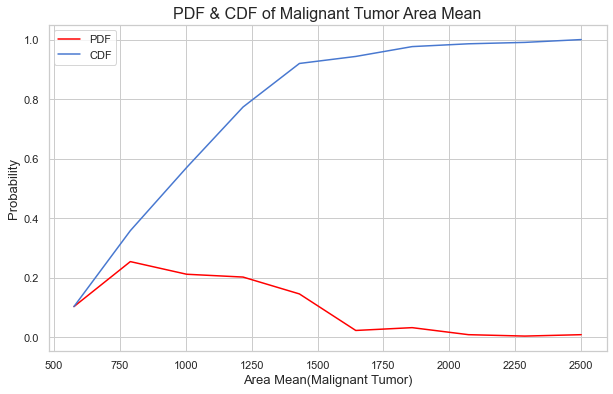

In [119]:

count, bins_count = np.histogram(df_clean[df_clean.diagnosis == 'M'].area_mean, bins=10)
  
pdf = count / sum(count)

cdf = np.cumsum(pdf)
  

plt.figure(figsize=(10, 6))
plt.plot(bins_count[1:], pdf, color="red", label="PDF")
plt.plot(bins_count[1:], cdf, label="CDF")
plt.legend()
plt.title("PDF & CDF of Malignant Tumor Area Mean", fontsize=16)
plt.xlabel(xlabel='Area Mean(Malignant Tumor)', fontsize=13)
plt.ylabel(ylabel='Probability', fontsize=13)

plt.show()


The CDF ranges from 0 to 1.

Text(0, 0.5, 'Probability')

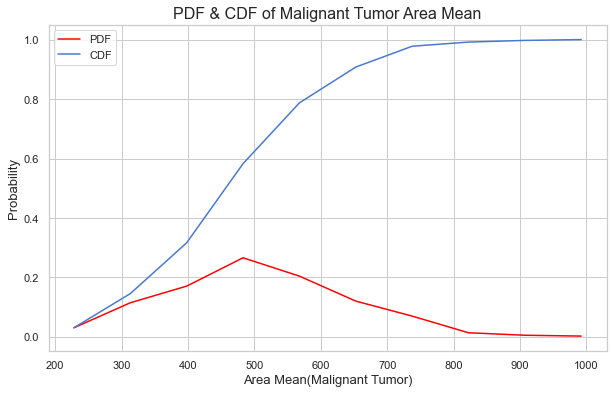

In [118]:

count, bins_count = np.histogram(df_clean[df_clean.diagnosis == 'B'].area_mean, bins=10)

pdf = count / sum(count)

cdf = np.cumsum(pdf)

plt.figure(figsize=(10, 6))
plt.plot(bins_count[1:], pdf, color="red", label="PDF")
plt.plot(bins_count[1:], cdf, label="CDF")
plt.legend()
plt.title("PDF & CDF of Malignant Tumor Area Mean", fontsize=16)
plt.xlabel(xlabel='Area Mean(Malignant Tumor)', fontsize=13)
plt.ylabel(ylabel='Probability', fontsize=13)


## Correlation (heatmap)

<AxesSubplot:>

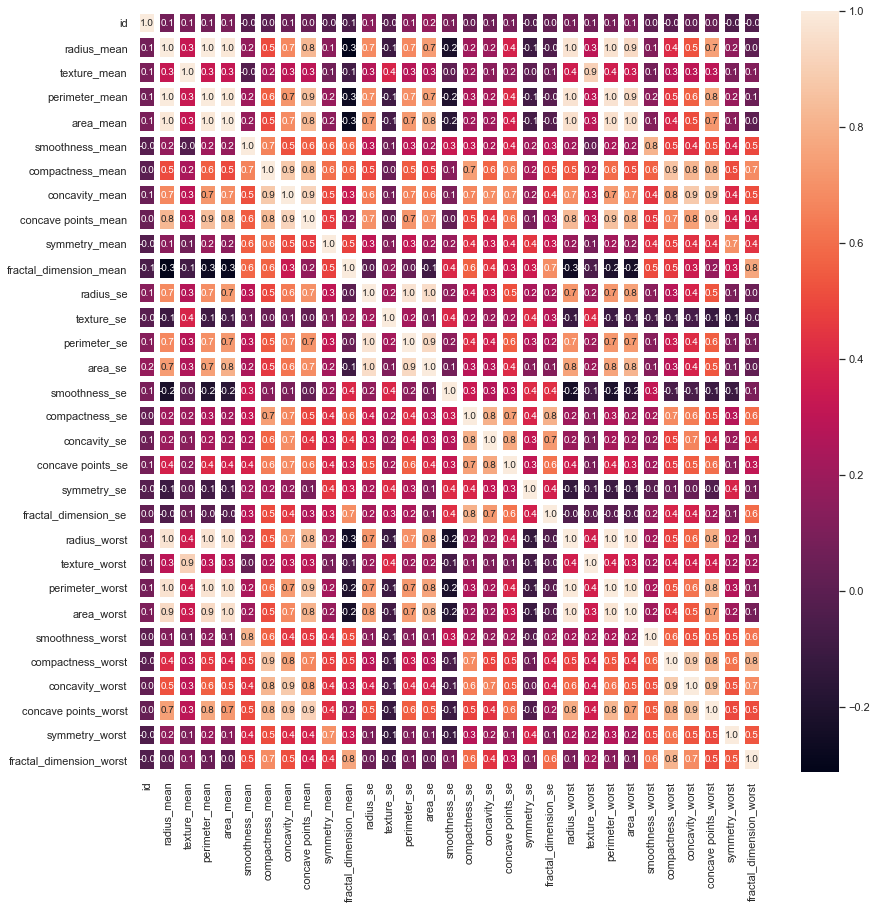

In [120]:
f,ax=plt.subplots(figsize=(14,14))
sns.heatmap(df_clean.corr(),annot=True, linewidths=5, fmt='.1f', ax=ax)

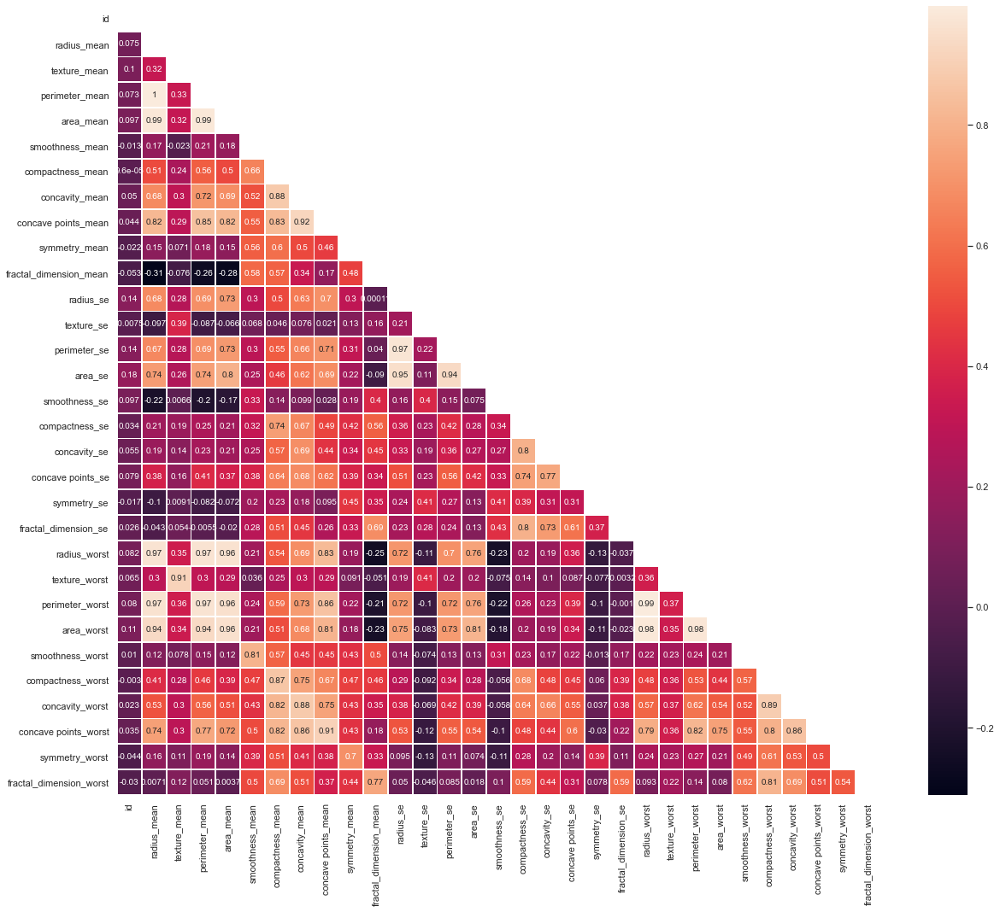

In [121]:
plt.figure(figsize=(20, 17))
matrix = np.triu(df_clean.corr())
sns.heatmap(df_clean.corr(), annot=True, linewidth=.8, mask=matrix, cmap="rocket");

We can observe from the heatmaps that, there are many negative correlations in this dataset.

## Plot of heatmap of  high correlated values

In [132]:
#I need to convert our categorical coumns, into numerical by using hot encoding on the dataset


from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler



for column in df_clean.columns:
  if df_clean[column].dtype == np.int64 or df_clean[column].dtype == np.float64:
    continue
  df_clean[column] = LabelEncoder().fit_transform(df_clean[column])

high_corr_data = df_clean.corr()
high_corr_columns = high_corr_data.index[abs(high_corr_data['diagnosis'])>=0.5]
high_corr_columns

Index(['diagnosis', 'radius_mean', 'perimeter_mean', 'area_mean',
       'compactness_mean', 'concavity_mean', 'concave points_mean',
       'radius_se', 'perimeter_se', 'area_se', 'radius_worst',
       'perimeter_worst', 'area_worst', 'compactness_worst', 'concavity_worst',
       'concave points_worst'],
      dtype='object')

<AxesSubplot:>

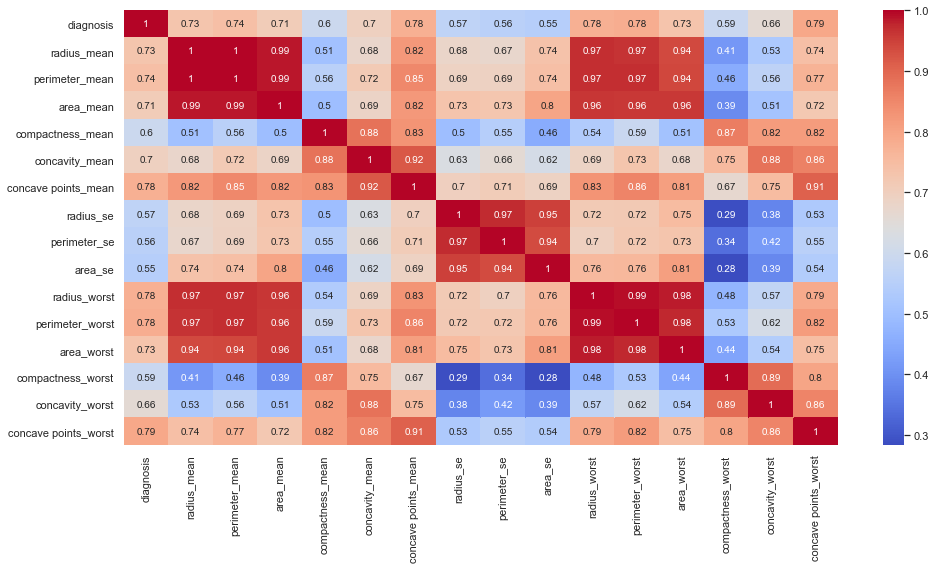

In [133]:
plt.figure(figsize=(16,8))
sns.heatmap(df_clean[high_corr_columns].corr(), annot=True, cmap="coolwarm")

## Pairplots

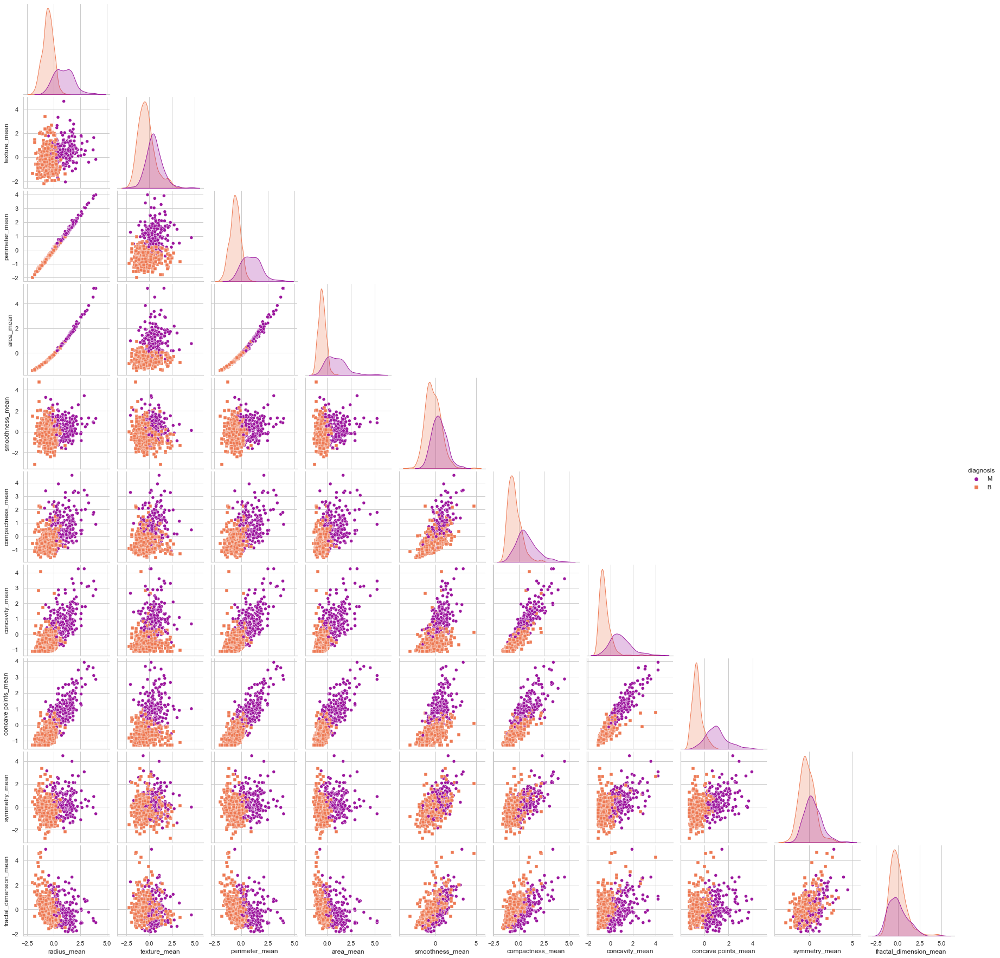

In [123]:
sns.pairplot(data3_m, hue='diagnosis', markers=['o', 's'], corner=True, palette='plasma')
plt.show()

This pairplot shows the positive correlation between area perimeter and radius, It also shows that area, perimeter , symmetry, compactness , radius of benign tumor is normally distributed and that of malignant is close to normal distribution.

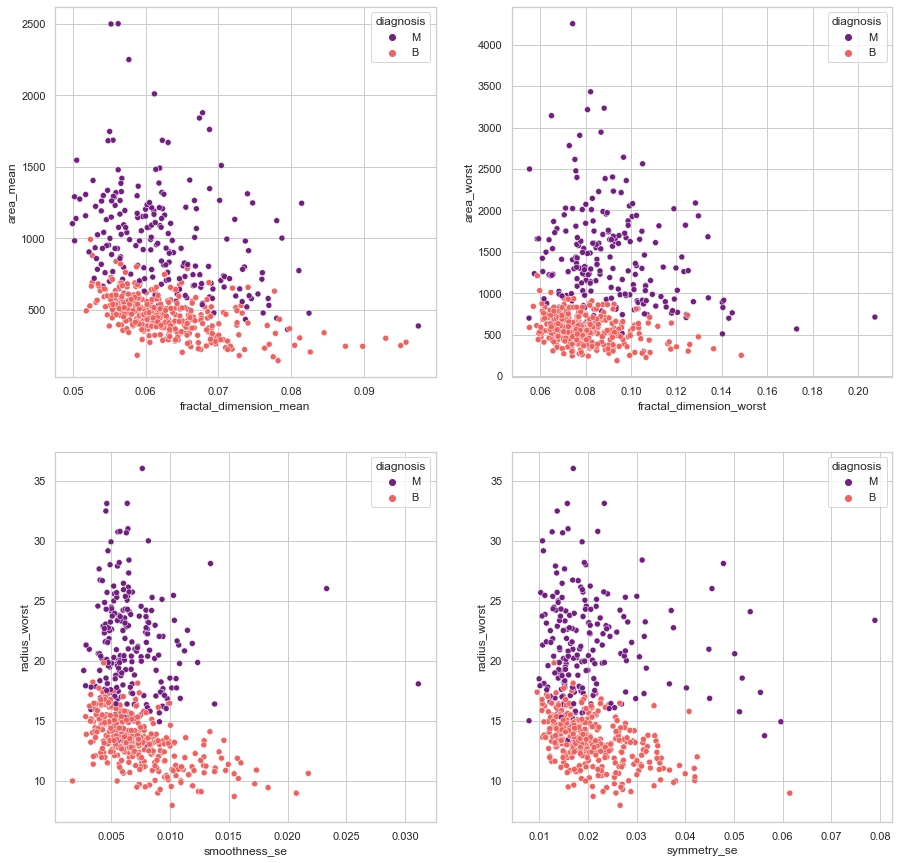

In [124]:
fig, ax = plt.subplots(2, 2, figsize=(15, 15))
sns.scatterplot(x='fractal_dimension_mean', y='area_mean', hue="diagnosis",
                data=df_clean, ax=ax[0][0], palette='magma')
sns.scatterplot(x='fractal_dimension_worst', y='area_worst', hue="diagnosis",
                data=df_clean, ax=ax[0][1], palette='magma')
sns.scatterplot(x='smoothness_se', y='radius_worst', hue="diagnosis",
                data=df_clean, ax=ax[1][0], palette='magma')
sns.scatterplot(x='symmetry_se', y='radius_worst', hue="diagnosis",
                data=df_clean, ax=ax[1][1], palette='magma');

C:\Users\hp\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


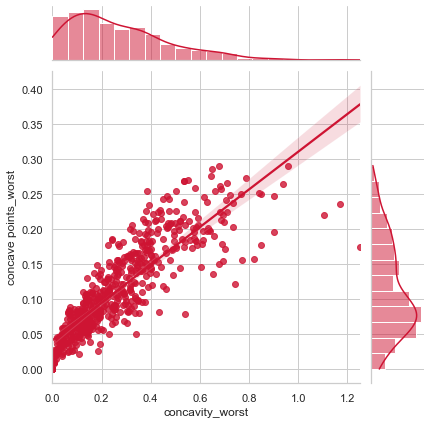

In [126]:
sns.jointplot(df_clean.loc[:,'concavity_worst'],df_clean.loc[:,'concave points_worst'],kind="reg", color="#ce1433")

We can notice that , the plot above showed a linear relation  between those two variable.

## Feature extraction and scaling

In [138]:
X = df_clean.iloc[:,2:].values

y = df_clean.iloc[:, 1:2].values

In [143]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)